In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import definitive_dyn_indicators.scripts.data_manager as dm
import os
import plotly.express as px
from tqdm.auto import tqdm
from numba import njit
import lmfit
import joblib
from joblib import Parallel, delayed

In [2]:
njobs = os.cpu_count()

# 0 - General setup

Remote Dir

In [ ]:
data = dm.data_manager(
    data_dir="/eos/project/d/da-and-diffusion-studies/DA_Studies/Simulations/Models/dynamic_indicator_analysis/big_data")

Local Dir

In [3]:
data = dm.data_manager(data_dir="/home/camontan/tmp/data/")

Setup config and get times

In [4]:
config = data.get_config()
print(list(config.keys()))
extents = config["x_extents"] + config["y_extents"]
samples = config["samples"]
print(samples)

['name', 'samples', 'random_seed', 'x_extents', 'y_extents', 'low_tracking', 'tracking', 'extreme_tracking', 't_base_10', 't_base_2', 't_list', 't_diff', 'x_sample', 'dx', 'y_sample', 'dy', 'xx', 'yy', 'x_flat', 'y_flat', 'px_flat', 'py_flat', 'total_samples', 'displacement', 'x_random_displacement', 'y_random_displacement', 'px_random_displacement', 'py_random_displacement', 'x_displacement', 'y_displacement', 'px_displacement', 'py_displacement']
1000


In [5]:
times = data.get_times()
print(times)

[      2       4       8      10      12      15      16      19      25
      31      32      39      50      63      64      79     100     125
     128     158     199     251     256     316     398     501     512
     630     794    1000    1024    1258    1584    1995    2048    2511
    3162    3981    4096    5011    6309    7943    8192   10000   12589
   15848   16384   19952   25118   31622   32768   39810   50118   63095
   65536   79432  100000  125892  131072  158489  199526  251188  262144
  316227  398107  501187  524288  630957  794328 1000000 1048576]


### Loading up specific group of datasets

In [6]:
group = data.get_groups()[2]
print(group)

group_name = f"$\\epsilon={group[3]}, \\mu={group[4]}$"
print(group_name)

(0.168, 0.201, 'sps', 8.0, -0.01, nan, nan, nan)
$\epsilon=8.0, \mu=-0.01$


### Visualizing the sample

In [7]:
stability = data.stability(group)


Getting file for group (0.168, 0.201, 'sps', 8.0, -0.01, nan, nan, nan) with displacement none and tracking track!


In [8]:
lyapunov = data.fast_lyapunov_indicator(group)

Getting file for group (0.168, 0.201, 'sps', 8.0, -0.01, nan, nan, nan) with displacement none and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.01, nan, nan, nan) with displacement random and tracking step_track!


100%|██████████| 71/71 [00:12<00:00,  5.76it/s]


In [9]:
raw_displacement = data.raw_displacement(group)

Getting file for group (0.168, 0.201, 'sps', 8.0, -0.01, nan, nan, nan) with displacement none and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.01, nan, nan, nan) with displacement random and tracking step_track!


100%|██████████| 71/71 [00:03<00:00, 19.82it/s]


In [15]:
lyapunov_multi = data.invariant_lyapunov_indicator(group)

Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement none and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement x and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement px and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement y and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement py and tracking step_track!


100%|██████████| 71/71 [00:56<00:00,  1.25it/s]


In [17]:
reverse = data.reversibility_error(group)

Getting file for group (0.168, 0.201, 'sps', 8.0, -0.01, nan, nan, nan) with displacement none and tracking track_and_reverse!


100%|██████████| 71/71 [00:08<00:00,  8.34it/s]


In [17]:
megno = data.megno(group)

Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement none and tracking megno!


100%|██████████| 71/71 [00:01<00:00, 45.48it/s]


In [18]:
sali = data.smallest_alignment_index(group)
gali = data.global_alignment_index(group)

Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement none and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement x and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement y and tracking step_track!


100%|██████████| 71/71 [00:41<00:00,  1.71it/s]


Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement none and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement x and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement y and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement px and tracking step_track!
Getting file for group (0.168, 0.201, 'sps', 8.0, -0.1, nan, nan, nan) with displacement py and tracking step_track!


100%|██████████| 71/71 [05:06<00:00,  4.31s/it]


In [12]:
radius = data.initial_radius()

 ### Execute this cell if you want to perform the downsampling

In [10]:
ds_step = 5

In [19]:
raw_displacement = dm.apply_downsample_to_dataset(raw_displacement, step=ds_step)
megno = dm.apply_downsample_to_dataset(megno, step=ds_step)
sali = dm.apply_downsample_to_dataset(sali, step=ds_step)
gali = dm.apply_downsample_to_dataset(gali, step=ds_step)


100%|██████████| 71/71 [00:00<00:00, 2793.58it/s]


In [18]:
reverse = dm.apply_downsample_to_dataset(reverse, step=ds_step)

100%|██████████| 71/71 [00:00<00:00, 1501.58it/s]


In [13]:
radius = dm.downsample(radius, step=ds_step)

In [14]:
stability = dm.downsample(stability, step=ds_step)
lyapunov = dm.apply_downsample_to_dataset(lyapunov, step=ds_step)

100%|██████████| 71/71 [00:00<00:00, 1671.26it/s]


In [15]:
extents = config["x_extents"] + config["y_extents"]
samples = config["samples"]//ds_step
print(samples)

200


### visualising the sample

/tmp/ipykernel_11826/2419872090.py:28: RuntimeWarning: divide by zero encountered in log10
  np.log10(reverse[val].to_numpy()).reshape(samples, samples),


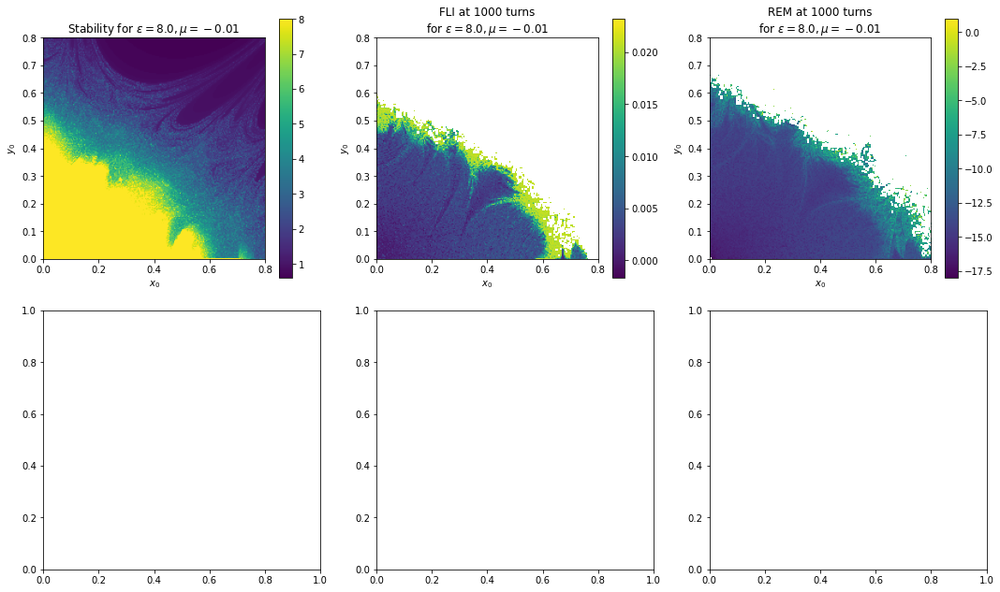

In [19]:
val = 1000

fig, axs = plt.subplots(2, 3, figsize=(15, 9))

im_00 = axs[0][0].imshow(
    np.log10(stability.reshape(samples, samples)),
    origin="lower",
    extent=extents,
)
# set colorbar for im_00
fig.colorbar(im_00, ax=axs[0][0])
axs[0][0].set_title(f"Stability for {group_name}")
axs[0][0].set_xlabel("$x_0$")
axs[0][0].set_ylabel("$y_0$")

im_01 = axs[0][1].imshow(
    lyapunov[val].to_numpy().reshape(samples, samples),
    origin="lower",
    extent=extents,
)
# set colorbar for im_01
fig.colorbar(im_01, ax=axs[0][1])
axs[0][1].set_title(f"FLI at {val} turns\nfor {group_name}")
axs[0][1].set_xlabel("$x_0$")
axs[0][1].set_ylabel("$y_0$")

im_02 = axs[0][2].imshow(
    np.log10(reverse[val].to_numpy()).reshape(samples, samples),
    origin="lower",
    extent=extents,
)
# set colorbar for im_02
fig.colorbar(im_02, ax=axs[0][2])
axs[0][2].set_title(f"REM at {val} turns\nfor {group_name}")
axs[0][2].set_xlabel("$x_0$")
axs[0][2].set_ylabel("$y_0$")

# im_10 = axs[1][0].imshow(
#     megno[val].to_numpy().reshape(samples, samples),
#     origin="lower",
#     extent=extents,
# )
# # set colorbar for im_10
# fig.colorbar(im_10, ax=axs[1][0])
# axs[1][0].set_title(f"MEGNO at {val} turns\nfor {group_name}")
# axs[1][0].set_xlabel("$x_0$")
# axs[1][0].set_ylabel("$y_0$")

# im_11 = axs[1][1].imshow(
#     np.log10(sali[val].to_numpy()).reshape(samples, samples),
#     origin="lower",
#     extent=extents,
# )
# # set colorbar for im_11
# fig.colorbar(im_11, ax=axs[1][1])
# axs[1][1].set_title(f"SALI at {val} turns\nfor {group_name}")
# axs[1][1].set_xlabel("$x_0$")
# axs[1][1].set_ylabel("$y_0$")

# im_12 = axs[1][2].imshow(
#     np.log10(gali[val].to_numpy()).reshape(samples, samples),
#     origin="lower",
#     extent=extents,
# )
# # set colorbar for im_12
# fig.colorbar(im_12, ax=axs[1][2])
# axs[1][2].set_title(f"GALI at {val} turns\nfor {group_name}")
# axs[1][2].set_xlabel("$x_0$")
# axs[1][2].set_ylabel("$y_0$")

plt.tight_layout()

# 1 - Chaos analysis

## 1.0 - Defining a "Golden Standard" for Chaos measurement

We recall the formula for the Fast Lyapunov Indicator computed after $n$ iterations of the map $M$:

$$
FLI_n(\mathbf{x}_0) = \frac{\ln\frac{|M^n(\mathbf{x}) - M^n(\mathbf{x} + \epsilon \mathbf{\hat{e}})|}{\epsilon}}{n}
$$

Let's consider two iteration times $n_1 = 10^3$ and $n_2 = 10^5$ and the corresponding values obtained by FLI

In [25]:
t1 = 100
t2 = 100000

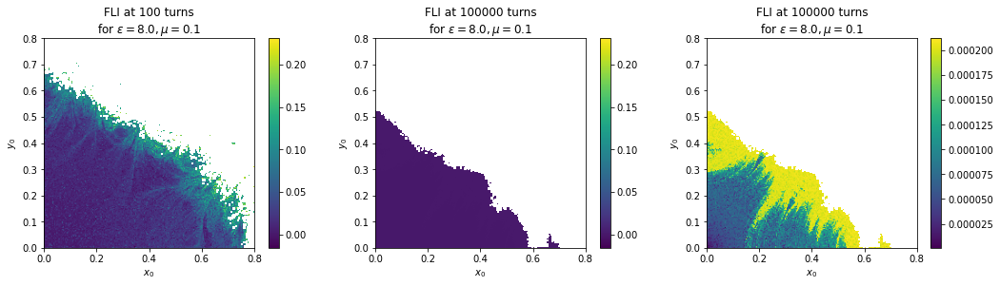

In [26]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4))

im_0 = axs[0].imshow(
    lyapunov[t1].to_numpy().reshape(samples, samples),
    origin="lower",
    extent=extents,
)
# set colorbar for im_0
fig.colorbar(im_0, ax=axs[0])
axs[0].set_title(f"FLI at {t1} turns\nfor {group_name}")
axs[0].set_xlabel("$x_0$")
axs[0].set_ylabel("$y_0$")

# use the same colorbar for im_1
im_1 = axs[1].imshow(
    lyapunov[t2].to_numpy().reshape(samples, samples),
    origin="lower",
    extent=extents,
    vmin=im_0.get_clim()[0],
    vmax=im_0.get_clim()[1],
)
# set colorbar for im_1
fig.colorbar(im_1, ax=axs[1])
axs[1].set_title(f"FLI at {t2} turns\nfor {group_name}")
axs[1].set_xlabel("$x_0$")
axs[1].set_ylabel("$y_0$")


im_1 = axs[2].imshow(
    lyapunov[t2].to_numpy().reshape(samples, samples),
    origin="lower",
    extent=extents,
)
# set colorbar for im_1
fig.colorbar(im_1, ax=axs[2])
axs[2].set_title(f"FLI at {t2} turns\nfor {group_name}")
axs[2].set_xlabel("$x_0$")
axs[2].set_ylabel("$y_0$")

plt.tight_layout()


We do observe a strong decrease in the FLI values, this is related to the distance boundaries given by the Hénon map: having a finite region for stable motion of radius $r$, a copule of particles can either

1. Maintain a displacement distance $< r$, which will lead FLI to zero as $n \to \infty$
2. Go $> r$ with the displacement, and eventually get lost in the chaotic region of the map.

Let's take as an estimation that $r = 1.0$ and let's visualize the resulting boundary along with the time evolution of FLI

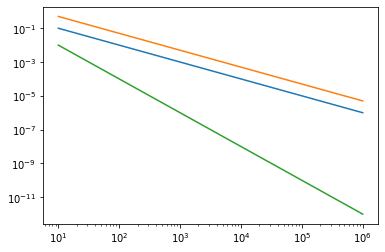

In [24]:
t = np.logspace(1, 6, 200)

plt.plot(t, 1/t)
plt.plot(t, 5/t)
plt.plot(t, np.power(1/t, 2))

plt.yscale("log")
plt.xscale("log")


In [20]:
@njit
def scale_law(x, a, k):
    return a/np.power(x, k)


@njit
def scale_law_3(x, a, b, k):
    return (a/np.power(x, k)) + b


@njit
def linear_law(x, a, b):
    return a * x + b

@njit
def log_fit(x, a, k):
    return -k * np.log10(x) + np.log10(a)


def residual(params, x, y):
    return (scale_law(x, params["a"].value, params["k"].value) - y) / y


def residual_3(params, x, y):
    return (scale_law_3(x, params["a"].value, params["b"].value, params["k"].value) - y)


def residual_linear(params, x, y):
    return (linear_law(x, params["a"].value, params["b"].value) - y)


def residual_log_fit(params, x, y):
    a = (params["a"].value)
    k = params["k"].value

    model = log_fit(x, a, k)
    return model - np.log10(y)

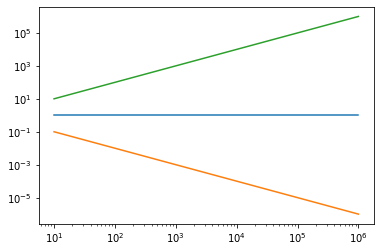

In [421]:
t = np.logspace(1, 6, 200)
plt.plot(
    t,
    scale_law(t, 1, 0),
)
plt.plot(
    t,
    scale_law(t, 1, 1),
)
plt.plot(
    t,
    scale_law(t, 1, -1),
)
plt.yscale("log")
plt.xscale("log")


In [21]:
def fit(x, y, s, i, kind="scale_law", extra_log=False):
    # print(i)
    try:
        if extra_log:
            y = np.log10(y)
        # x = (x[np.logical_and(np.logical_not(np.isnan(y)), y > 0)])
        # y = (y[np.logical_and(np.logical_not(np.isnan(y)), y > 0)])
        x = np.absolute((x[np.logical_not(np.isnan(y))]))
        y = np.absolute((y[np.logical_not(np.isnan(y))]))
        # y = y[x>100]
        # x = x[x>100]
        if len(x[x>100]) < 2:
            return "discarded"

        f = scipy.interpolate.interp1d(x, y, kind="linear")
        x = np.unique(np.sort(np.concatenate((np.asarray(x, dtype=float), np.linspace(x[0], x[-1], 2000)))))
        y = f(x)

        params = lmfit.Parameters()
        if kind=="scale_law":
            params.add("a", value=1, min=0)
            params.add("k", value=1)
            result = lmfit.minimize(residual, params, args=(x, y))
        elif kind=="scale_law_3":
            params.add("a", value=1)
            params.add("b", value=0)
            params.add("k", value=1)
            result = lmfit.minimize(residual_3, params, args=(x, y))
        elif kind=="linear_law":
            params.add("a", value=1)
            params.add("b", value=1)
            result = lmfit.minimize(residual_linear, params, args=(x, y))
        elif kind=="log_fit":
            params.add("a", value=1, min=0)
            params.add("k", value=1)
            result = lmfit.minimize(residual_log_fit, params, args=(x, y))
        else:
            raise ValueError(f"kind {kind} not recognized")
        return result
    except ValueError:
        # print(e)
        return "error"


In [433]:
report_list_1 = joblib.Parallel(n_jobs=4)(
    delayed(fit)(x[1].index.to_numpy(), x[1].to_numpy(), y, i, kind="scale_law") for i, (x, y) in enumerate(zip(lyapunov.iterrows(), stability)))

par_1_a = np.array([x.params["a"].value if x != "error" and x !=
                    "discarded" else np.nan for x in report_list_1])
par_1_k = np.array([x.params["k"].value if x != "error" and x !=
                    "discarded" else np.nan for x in report_list_1])
par_1_chi = np.array([x.chisqr if x != "error" and x !=
                     "discarded" else np.nan for x in report_list_1])


In [311]:
report_list_2 = joblib.Parallel(n_jobs=4)(
    delayed(fit)(x[1].index.to_numpy(), x[1].to_numpy(), y, i, kind="linear_law") for i, (x, y) in enumerate(zip(lyapunov.iterrows(), stability)))

par_2_a = np.array([x.params["a"].value if x != "error" and x !=
                   "discarded" else np.nan for x in report_list_2])
par_2_b = np.array([x.params["b"].value if x != "error" and x !=
                   "discarded" else np.nan for x in report_list_2])
par_2_chi = np.array([x.chisqr if x != "error" and x !=
                     "discarded" else np.nan for x in report_list_2])


In [22]:
report_list_3 = joblib.Parallel(n_jobs=njobs)(
    delayed(fit)(x[1].index.to_numpy(), x[1].to_numpy(), y, i, kind="log_fit") for i, (x, y) in enumerate(zip(lyapunov.iterrows(), stability)))

par_3_a = np.array([x.params["a"].value if x != "error" and x !=
                   "discarded" else np.nan for x in report_list_3])
par_3_k = np.array([x.params["k"].value if x != "error" and x !=
                    "discarded" else np.nan for x in report_list_3])
par_3_chi = np.array([x.chisqr if x != "error" and x !=
                     "discarded" else np.nan for x in report_list_3])


In [23]:
report_list_3 = joblib.Parallel(n_jobs=njobs)(
    delayed(fit)(x[1].index.to_numpy(), x[1].to_numpy(), y, i, kind="log_fit") for i, (x, y) in enumerate(zip(reverse.iterrows(), stability)))

r_par_3_a = np.array([x.params["a"].value if x != "error" and x !=
                   "discarded" else np.nan for x in report_list_3])
r_par_3_k = np.array([x.params["k"].value if x != "error" and x !=
                    "discarded" else np.nan for x in report_list_3])
r_par_3_chi = np.array([x.chisqr if x != "error" and x !=
                     "discarded" else np.nan for x in report_list_3])


In [31]:
report_list_1[0].params["a"].value

NameError: name 'report_list_1' is not defined

Text(0.5, 1.0, 'scale law a/x^k\n(value of k, capped to 1)')

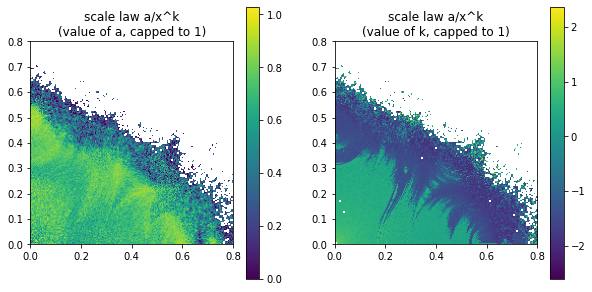

In [24]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

map = axs[0].imshow(par_3_k.reshape(samples, samples),
                    origin="lower", extent=extents, cmap="viridis", vmin=0)
fig.colorbar(map, ax=axs[0])

axs[0].set_title("scale law a/x^k\n(value of a, capped to 1)")

r_par_3_k[np.isnan(par_3_k)] = np.nan

map = axs[1].imshow(r_par_3_k.reshape(samples, samples),
                    origin="lower", extent=extents, cmap="viridis")
fig.colorbar(map, ax=axs[1])
axs[1].set_title("scale law a/x^k\n(value of k, capped to 1)")


Text(0.5, 1.0, 'scale law a/x^k\n(value of k, capped to 1)')

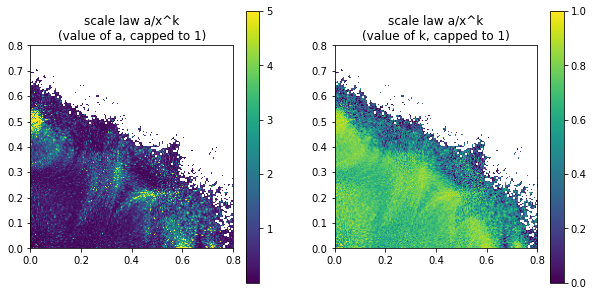

In [25]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

map = axs[0].imshow(par_3_a.reshape(samples, samples), origin="lower", extent=extents, cmap="viridis", vmax=5)
fig.colorbar(map, ax=axs[0])

axs[0].set_title("scale law a/x^k\n(value of a, capped to 1)")

map = axs[1].imshow(par_3_k.reshape(samples, samples), origin="lower", extent=extents, cmap="viridis", vmax=1, vmin=0)
fig.colorbar(map, ax=axs[1])
axs[1].set_title("scale law a/x^k\n(value of k, capped to 1)")


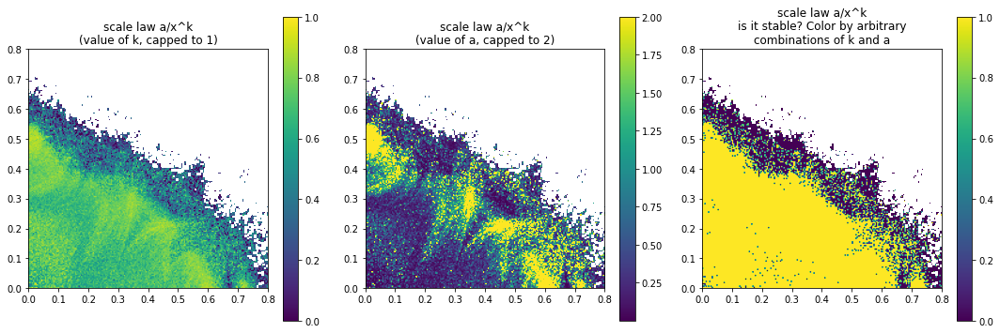

In [36]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

map = axs[0].imshow(par_3_k.reshape(samples, samples), origin="lower", extent=extents, cmap="viridis", vmin=0, vmax=1)
fig.colorbar(map, ax=axs[0])
axs[0].set_title("scale law a/x^k\n(value of k, capped to 1)")

map = axs[1].imshow((par_3_a).reshape(samples, samples),
                    origin="lower", extent=extents, cmap="viridis", vmax=2)
fig.colorbar(map, ax=axs[1])
axs[1].set_title("scale law a/x^k\n(value of a, capped to 2)")

stable_block = np.logical_or(
    np.logical_and(par_3_k > 0.7, par_3_a < 3),
    np.logical_and(par_3_k > 0.0, par_3_a < 0.5),
)
stable_block = np.logical_and(par_3_k > 0.0, par_3_a < 0.5)
stable_block = par_3_k > 0.0
stable_block = par_3_k > 0.5
stable_block = np.logical_and(par_3_k > 0.5, par_3_a < 8)
stable_block = np.asarray(stable_block, dtype=np.float32)
stable_block[np.isnan(par_3_k)] = np.nan

map = axs[2].imshow(stable_block.reshape(samples, samples), origin="lower", extent=extents, cmap="viridis", vmax=1, vmin=0)
fig.colorbar(map, ax=axs[2])
axs[2].set_title("scale law a/x^k\nis it stable? Color by arbitrary\ncombinations of k and a")
plt.tight_layout()


Text(0.5, 1.0, 'scale law a/x^k\n(is it stable?)')

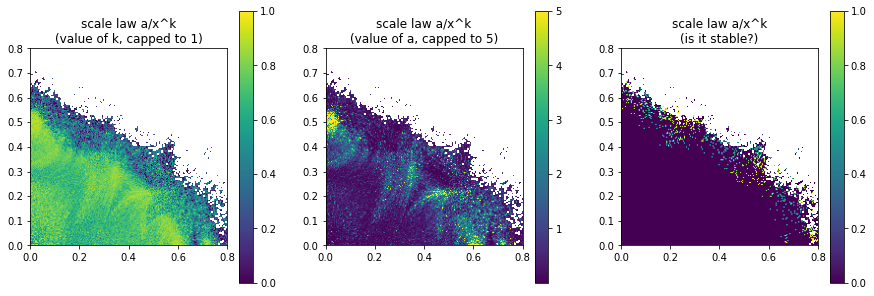

In [37]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

map = axs[0].imshow(par_3_k.reshape(samples, samples), origin="lower", extent=extents, cmap="viridis", vmin=0, vmax=1)
fig.colorbar(map, ax=axs[0])
axs[0].set_title("scale law a/x^k\n(value of k, capped to 1)")

map = axs[1].imshow((par_3_a).reshape(samples, samples),
                    origin="lower", extent=extents, cmap="viridis", vmax=5)
fig.colorbar(map, ax=axs[1])
axs[1].set_title("scale law a/x^k\n(value of a, capped to 5)")

stable_block = np.logical_and(
    par_3_k < 0.1,
    par_3_a < 1000000,
)

stable_block = np.asarray(stable_block, dtype=np.float32)
stable_block[np.isnan(par_3_k)] = np.nan

map = axs[2].imshow(stable_block.reshape(samples, samples), origin="lower", extent=extents, cmap="viridis", vmax=1, vmin=0)
fig.colorbar(map, ax=axs[2])
axs[2].set_title("scale law a/x^k\n(is it stable?)")


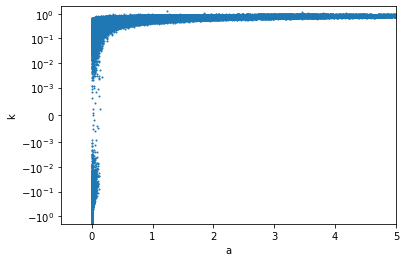

In [601]:
plt.scatter(par_3_a, par_3_k, s=1)
plt.xlabel("a")
plt.ylabel("k")
plt.xlim(-0.5, 5)
plt.ylim(-2, 2)
plt.yscale("symlog", linthresh=0.001)


idx: 32425
a: 0.11606575300506461, k: -0.06485286633115406


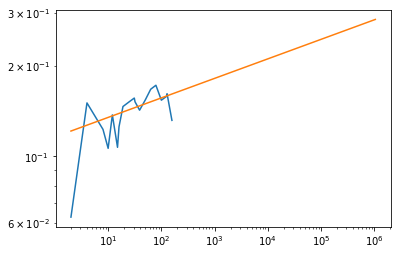

In [99]:
idx = np.where(
    np.logical_and(par_3_k < 0.3, radius > 0.3)
)[0]
idx = idx[np.random.randint(0, len(idx))]
print(f"idx: {idx}")

# plt.plot(lyapunov.iloc[idx].index.to_numpy(),
#          np.absolute(lyapunov.iloc[idx].to_numpy()))
plt.plot(lyapunov.iloc[idx].index.to_numpy(),
         (lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), np.power(10, log_fit(
    lyapunov.iloc[idx].index.to_numpy(), par_3_a[idx], par_3_k[idx])))

print(f"a: {par_3_a[idx]}, k: {par_3_k[idx]}")

plt.xscale("log")
plt.yscale("log")
#plt.yscale("symlog", linthresh=1e-5)


idx: 21678


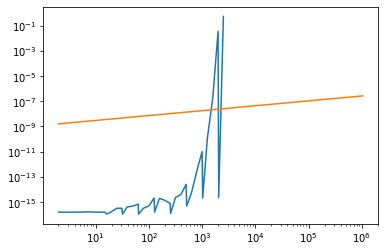

In [157]:
idx = np.random.randint(0, len(par_3_a))
print(f"idx: {idx}")
plt.plot(reverse.iloc[idx].index.to_numpy(),
        ((reverse.iloc[idx].to_numpy())))
plt.plot(reverse.iloc[idx].index.to_numpy(), np.power(10, log_fit(
    reverse.iloc[idx].index.to_numpy(), r_par_3_a[idx], r_par_3_k[idx])))
plt.xscale("log")
plt.yscale("log")


idx: 571
a: 5.532020189477686, k: 0.8979432350589776


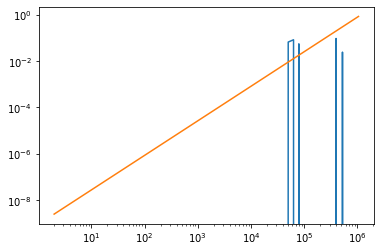

In [124]:
idx = np.where(
    np.logical_and(r_par_3_k < 0.0, radius > 0.3)
)[0]
idx = idx[np.random.randint(0, len(idx))]
print(f"idx: {idx}")

# plt.plot(lyapunov.iloc[idx].index.to_numpy(),
#          np.absolute(lyapunov.iloc[idx].to_numpy()))
plt.plot(reverse.iloc[idx].index.to_numpy(),
         np.log10((reverse.iloc[idx].to_numpy())))

plt.plot(reverse.iloc[idx].index.to_numpy(), np.power(10, log_fit(
    reverse.iloc[idx].index.to_numpy(), r_par_3_a[idx], r_par_3_k[idx])))

print(f"a: {par_3_a[idx]}, k: {par_3_k[idx]}")

plt.xscale("log")
plt.yscale("log")
#plt.yscale("symlog", linthresh=1e-5)


idx: 17275
a: 0.01767701341851735, k: 0.17569787988109137


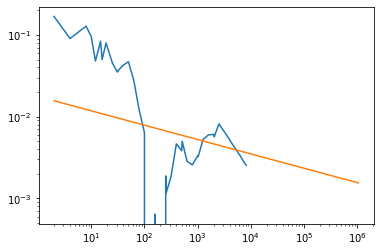

In [110]:
idx = np.where(
    np.logical_and(par_3_k < 0.2, radius < 0.5)
)[0]
idx = idx[np.random.randint(0, len(idx))]
print(f"idx: {idx}")

# plt.plot(lyapunov.iloc[idx].index.to_numpy(),
#          np.absolute(lyapunov.iloc[idx].to_numpy()))
plt.plot(lyapunov.iloc[idx].index.to_numpy(),
         (lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), np.power(10, log_fit(
    lyapunov.iloc[idx].index.to_numpy(), par_3_a[idx], par_3_k[idx])))

print(f"a: {par_3_a[idx]}, k: {par_3_k[idx]}")

plt.xscale("log")
plt.yscale("log")
#plt.yscale("symlog", linthresh=1e-5)


NameError: name 'par_1_chi' is not defined

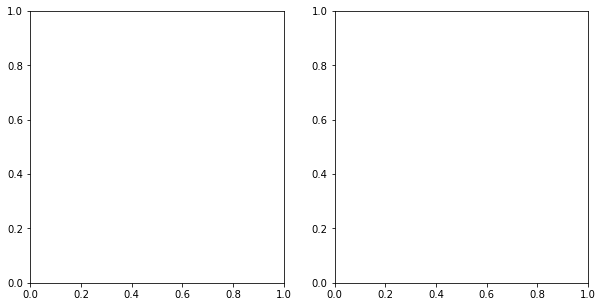

In [111]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(par_1_chi.reshape(samples, samples), origin="lower", extent=extents, cmap="viridis")
bool_data = np.asarray((par_1_chi > par_2_chi), dtype=np.float64)
bool_data[np.isnan(par_1_chi)] = np.nan
axs[1].imshow(bool_data.reshape(samples, samples),
              origin="lower", extent=extents, cmap="viridis")


Text(0.5, 1.0, 'scale law a/x^k\n(value of k)')

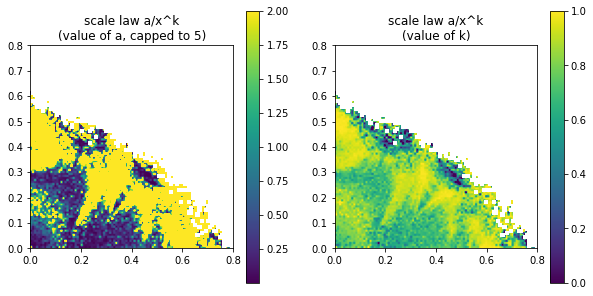

In [458]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

map = axs[0].imshow(par_3_a.reshape(samples, samples),
              origin="lower", extent=extents, cmap="viridis", vmax=2.0)
fig.colorbar(map, ax=axs[0])
axs[0].set_title("scale law a/x^k\n(value of a, capped to 5)")

map = axs[1].imshow(par_3_k.reshape(samples, samples),
              origin="lower", extent=extents, cmap="viridis", vmax=1.0, vmin=-0.0)
fig.colorbar(map, ax=axs[1])
axs[1].set_title("scale law a/x^k\n(value of k)")

100%|██████████| 8/8 [00:00<00:00, 100.65it/s]


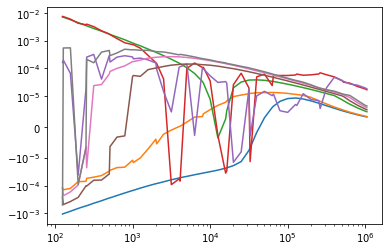

In [477]:
idxs = np.where(
    np.logical_and(par_1_k <= 0.2, radius <= 0.2))
for idx in tqdm(idxs[0]):
    x = lyapunov.iloc[idx].index.to_numpy()
    y = lyapunov.iloc[idx].to_numpy()
    y = y[x > 100]
    x = x[x > 100]
    plt.plot(x, y)


plt.xscale("log")
plt.yscale("log")
plt.yscale("symlog", linthresh=1e-5)


100%|██████████| 77/77 [00:00<00:00, 469.10it/s]


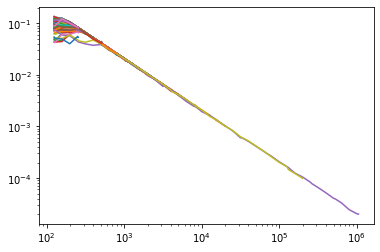

In [459]:
idxs = np.where(
    np.logical_and(par_1_k >= 1.0, par_1_a >= 5.0))
for idx in tqdm(idxs[0]):
    x = lyapunov.iloc[idx].index.to_numpy()
    y = lyapunov.iloc[idx].to_numpy()
    y = y[x>100]
    x = x[x>100]
    plt.plot(x, y)


plt.xscale("log")
plt.yscale("log")
#plt.yscale("symlog", linthresh=1e-5)


100%|██████████| 124/124 [00:00<00:00, 366.60it/s]


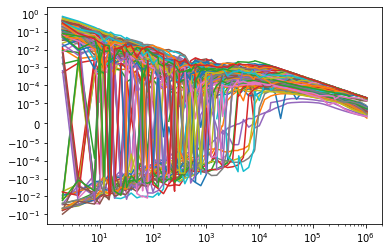

In [339]:
idxs = np.where(
    np.logical_and(par_1_k < 0.5, stability>=10000000)
)
for idx in tqdm(idxs[0]):

    plt.plot(lyapunov.iloc[idx].index.to_numpy(),
            (lyapunov.iloc[idx].to_numpy()))


plt.xscale("log")
plt.yscale("log")
plt.yscale("symlog", linthresh=1e-5)


100%|██████████| 27/27 [00:00<00:00, 444.46it/s]


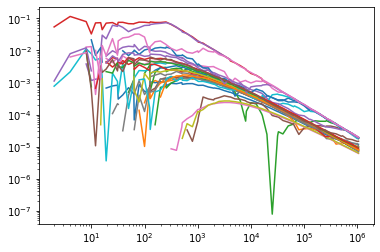

In [318]:
idxs = np.where(
    np.logical_and(par_1_k < 0.2, stability>=10000000)
)
for idx in tqdm(idxs[0]):

    plt.plot(lyapunov.iloc[idx].index.to_numpy(),
            np.absolute(lyapunov.iloc[idx].to_numpy()))


plt.xscale("log")
plt.yscale("log")
#plt.yscale("symlog", linthresh=1e-5)


100%|██████████| 27/27 [00:00<00:00, 464.09it/s]


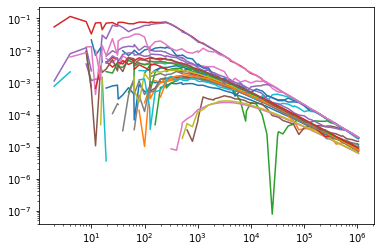

In [319]:
idxs = np.where(
    np.logical_and(par_1_k < 0.2, stability>=10000000)
)
for idx in tqdm(idxs[0]):
    x = lyapunov.iloc[idx].index.to_numpy()
    y = lyapunov.iloc[idx].to_numpy()
    y[y < 0] = np.nan
    plt.plot(x, y)

plt.xscale("log")
plt.yscale("log")
#plt.yscale("symlog", linthresh=1e-5)


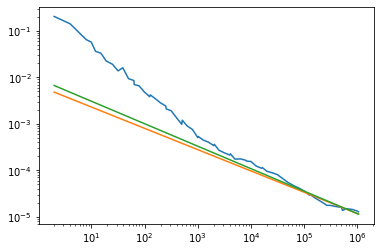

In [478]:
idx = np.where(
    np.logical_and(par_1_k < 0.5, par_1_k > 0.2, np.ones_like(par_1_k)==1)
)[0][-220]

# plt.plot(lyapunov.iloc[idx].index.to_numpy(),
#          np.absolute(lyapunov.iloc[idx].to_numpy()))
plt.plot(lyapunov.iloc[idx].index.to_numpy(),
         (lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(
   lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), np.power(10, log_fit(
   lyapunov.iloc[idx].index.to_numpy(), par_3_a[idx], par_3_k[idx])))

plt.xscale("log")
plt.yscale("log")
#plt.yscale("symlog", linthresh=1e-5)


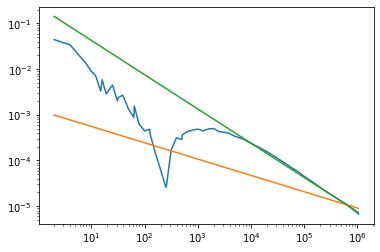

In [480]:
idx = np.where(par_3_chi > par_2_chi)[0][100]
plt.plot(lyapunov.iloc[idx].index.to_numpy(), np.absolute(lyapunov.iloc[idx].to_numpy()))


plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(
    lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), np.power(10, log_fit(
    lyapunov.iloc[idx].index.to_numpy(), par_3_a[idx], par_3_k[idx])))

plt.xscale("log")
plt.yscale("log")


a: 1e+01, k: 0.91


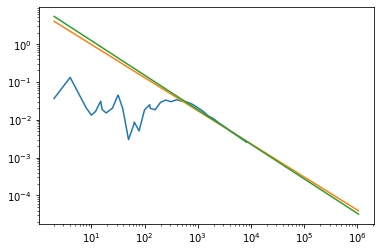

In [498]:
idx = np.where(par_3_chi > par_2_chi)[0]
idx = idx[np.random.randint(0, len(idx))]
plt.plot(lyapunov.iloc[idx].index.to_numpy(), np.absolute(lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(
    lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), np.power(10, log_fit(
    lyapunov.iloc[idx].index.to_numpy(), par_3_a[idx], par_3_k[idx])))
print(f"a: {par_3_a[idx]:.2}, k: {par_3_k[idx]:.2}")
plt.xscale("log")
plt.yscale("log")


idx: 4925
a: 0.0024, k: 0.0085


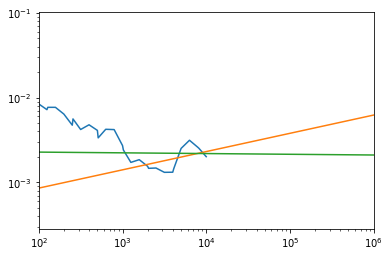

In [526]:
idx = np.where(np.logical_and(par_3_k < 0.2, radius < 0.5))[0]
idx = idx[np.random.randint(0, len(idx))]
print(f"idx: {idx}")
plt.plot(lyapunov.iloc[idx].index.to_numpy(),
         np.absolute(lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(
    lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), np.power(10, log_fit(
    lyapunov.iloc[idx].index.to_numpy(), par_3_a[idx], par_3_k[idx])))
print(f"a: {par_3_a[idx]:.2}, k: {par_3_k[idx]:.2}")
plt.xscale("log")
plt.xlim(1e2, 1e6)
plt.yscale("log")


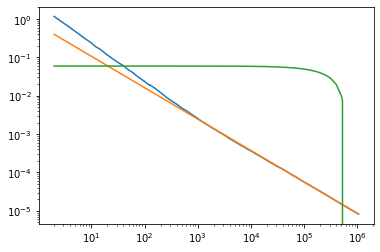

In [501]:
idx = np.where(par_1_chi < par_2_chi)[0][10]
plt.plot(lyapunov.iloc[idx].index.to_numpy(), np.absolute(lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), linear_law(lyapunov.iloc[idx].index.to_numpy(), par_2_a[idx], par_2_b[idx]))

plt.xscale("log")
plt.yscale("log")


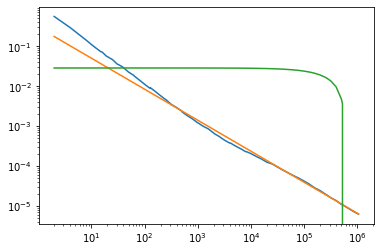

In [465]:
idx = np.where(par_1_chi > par_2_chi)[0][10]
plt.plot(lyapunov.iloc[idx].index.to_numpy(), (lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), linear_law(lyapunov.iloc[idx].index.to_numpy(), par_2_a[idx], par_2_b[idx]))

plt.xscale("log")
plt.yscale("log")


Par a/x^k: a:0.98, k:0.48
Par a*x + b: a:-0.00032, b:0.13


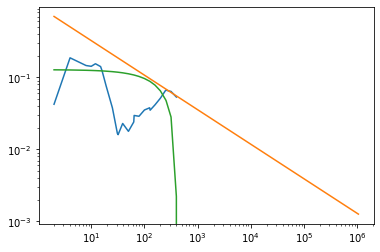

In [466]:
idx = np.where(par_1_chi > par_2_chi)[0][-40]
plt.plot(lyapunov.iloc[idx].index.to_numpy(), (lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), linear_law(lyapunov.iloc[idx].index.to_numpy(), par_2_a[idx], par_2_b[idx]))

print(f"Par a/x^k: a:{par_1_a[idx]:.2}, k:{par_1_k[idx]:.2}")
print(f"Par a*x + b: a:{par_2_a[idx]:.2}, b:{par_2_b[idx]:.2}")

plt.xscale("log")
plt.yscale("log")


Par a/x^k: a:0.54, k:0.11
Par a*x + b: a:-0.0044, b:0.49


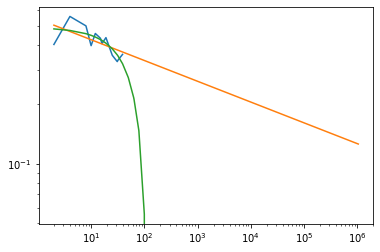

In [289]:
idx = np.where(par_1_chi > par_2_chi)[0][-40]
plt.plot(lyapunov.iloc[idx].index.to_numpy(), (lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), linear_law(lyapunov.iloc[idx].index.to_numpy(), par_2_a[idx], par_2_b[idx]))

print(f"Par a/x^k: a:{par_1_a[idx]:.2}, k:{par_1_k[idx]:.2}")
print(f"Par a*x + b: a:{par_2_a[idx]:.2}, b:{par_2_b[idx]:.2}")

plt.xscale("log")
plt.yscale("log")


Par a/x^k: a:0.24, k:2.3e-10
Par a*x + b: a:0.0038, b:0.15


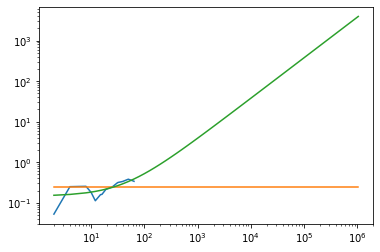

In [290]:
idx = np.where(par_1_chi > par_2_chi)[0][-50]
plt.plot(lyapunov.iloc[idx].index.to_numpy(), (lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), linear_law(lyapunov.iloc[idx].index.to_numpy(), par_2_a[idx], par_2_b[idx]))

print(f"Par a/x^k: a:{par_1_a[idx]:.2}, k:{par_1_k[idx]:.2}")
print(f"Par a*x + b: a:{par_2_a[idx]:.2}, b:{par_2_b[idx]:.2}")

plt.xscale("log")
plt.yscale("log")


Par a/x^k: a:0.0002, k:0.13
Par a*x + b: a:-9.4e-11, b:0.00011


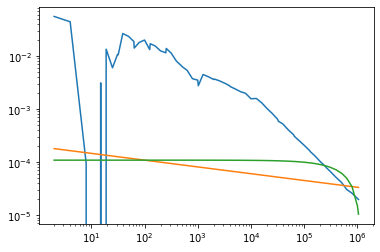

In [234]:
idx = np.where(par_1_chi > par_2_chi)[0][-140]
plt.plot(lyapunov.iloc[idx].index.to_numpy(), (lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), linear_law(lyapunov.iloc[idx].index.to_numpy(), par_2_a[idx], par_2_b[idx]))

print(f"Par a/x^k: a:{par_1_a[idx]:.2}, k:{par_1_k[idx]:.2}")
print(f"Par a*x + b: a:{par_2_a[idx]:.2}, b:{par_2_b[idx]:.2}")

plt.xscale("log")
plt.yscale("log")


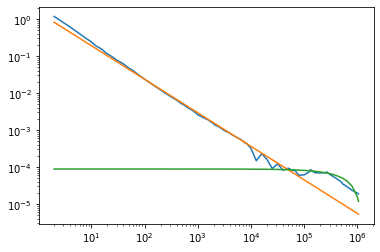

In [226]:
idx = np.where(par_1_chi < par_2_chi)[0][300]
plt.plot(lyapunov.iloc[idx].index.to_numpy(), (lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), linear_law(lyapunov.iloc[idx].index.to_numpy(), par_2_a[idx], par_2_b[idx]))

plt.xscale("log")
plt.yscale("log")


13.23341903690676
3.9690404940001733


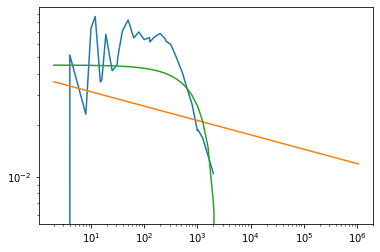

In [202]:
idx = np.where(np.logical_and(par_2_chi < 10, par_2_chi < par_1_chi))[0][20]
print(par_1_chi[idx])
print(par_2_chi[idx])

plt.plot(lyapunov.iloc[idx].index.to_numpy(), (lyapunov.iloc[idx].to_numpy()))

plt.plot(lyapunov.iloc[idx].index.to_numpy(), scale_law(lyapunov.iloc[idx].index.to_numpy(), par_1_a[idx], par_1_k[idx]))
plt.plot(lyapunov.iloc[idx].index.to_numpy(), linear_law(lyapunov.iloc[idx].index.to_numpy(), par_2_a[idx], par_2_b[idx]))

plt.xscale("log")
plt.yscale("log")


In [42]:
# count number of "discarded" in report_list
discarded = 0
error = 0
for i, r in enumerate(report_list_1):
    if r == "error":
        error += 1
    elif r == "discarded":
        discarded += 1
print(discarded)
print(error)
print(samples * samples - discarded - error)


5256
0
4744


In [105]:
a = np.ones(len(stability)) * np.nan
k = np.ones(len(stability)) * np.nan
chi = np.ones(len(stability)) * np.nan

for i, d in tqdm(enumerate(lyapunov.iterrows()), total=len(stability)):
    if stability[i] < 1000:
        continue
    parameters = lmfit.Parameters()
    parameters.add("a", value=1, min=0)
    parameters.add("k", value=1, min=0)

    x = np.absolute(d[1].index.to_numpy()[np.logical_not(np.isnan(d[1].to_numpy()))])
    y = np.absolute(d[1].to_numpy()[np.logical_not(np.isnan(d[1].to_numpy()))])

    if len(x) <= 2:
        continue    
    result = lmfit.minimize(residual, parameters,args=(x, y))
    a[i] = (result.params["a"].value)
    k[i] = (result.params["k"].value)
    chi[i] = (result.chisqr)

100%|██████████| 1000000/1000000 [19:49<00:00, 840.67it/s] 


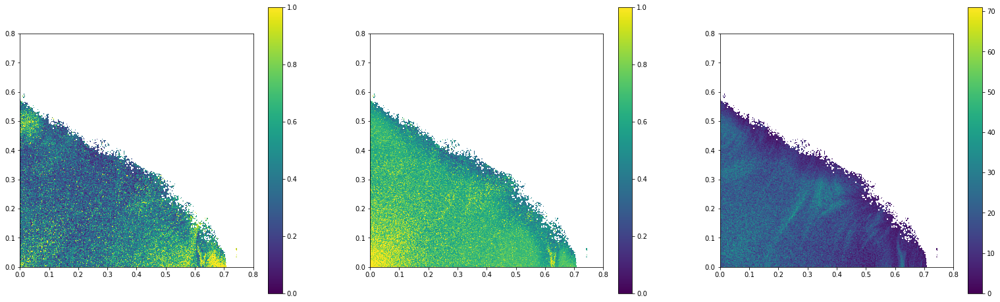

In [119]:
fig, axs = plt.subplots(1, 3, figsize=(27, 8))

tmp_a = a.copy()
tmp_k = k.copy()
tmp_chi = chi.copy()

map = axs[0].imshow(tmp_a.reshape(1000, 1000), origin="lower", extent=extents, vmax=1)
fig.colorbar(map, ax=axs[0])

map = axs[1].imshow(tmp_k.reshape(1000, 1000), origin="lower", extent=extents, vmax=1)
fig.colorbar(map, ax=axs[1])

map = axs[2].imshow(tmp_chi.reshape(1000, 1000), origin="lower", extent=extents)
fig.colorbar(map, ax=axs[2])


In [133]:
a_3 = np.ones(len(stability)) * np.nan
b_3 = np.ones(len(stability)) * np.nan
k_3 = np.ones(len(stability)) * np.nan
chi_3 = np.ones(len(stability)) * np.nan

for i, d in tqdm(enumerate(lyapunov.iterrows()), total=len(stability)):
    if stability[i] < 1000:
        continue
    parameters = lmfit.Parameters()
    parameters.add("a", value=1, min=0)
    parameters.add("b", value=0)
    parameters.add("k", value=1, min=0)

    x = np.absolute(d[1].index.to_numpy()[np.logical_not(np.isnan(d[1].to_numpy()))])
    y = np.absolute(d[1].to_numpy()[np.logical_not(np.isnan(d[1].to_numpy()))])

    if len(x) <= 2:
        continue    
    result = lmfit.minimize(residual_3, parameters,args=(x, y))
    a_3[i] = (result.params["a"].value)
    b_3[i] = (result.params["b"].value)
    k_3[i] = (result.params["k"].value)
    chi_3[i] = (result.chisqr)


100%|██████████| 1000000/1000000 [1:29:31<00:00, 186.15it/s] 


(array([19291., 35586., 36526., 32288., 28234., 24279., 20981., 17701.,
        15243., 12943., 11212.,  9906.,  8696.,  7769.,  7012.,  6282.,
         5949.,  5477.,  4924.,  4741.,  4558.,  4437.,  4171.,  3941.,
         3841.,  3952.,  3756.,  3660.,  3711.,  3529.,  3468.,  3433.,
         3387.,  3292.,  3262.,  3419.,  3269.,  3221.,  3020.,  2954.,
         2970.,  2945.,  2797.,  2759.,  2622.,  2456.,  2429.,  2282.,
         2343.,  2227.,  2193.,  2041.,  1917.,  1890.,  1739.,  1710.,
         1581.,  1563.,  1450.,  1396.,  1387.,  1399.,  1293.,  1405.,
         1345.,  1298.,  1273.,  1342.,  1265.,  1306.,  1296.,  1211.,
         1272.,  1197.,  1132.,  1111.,   971.,   785.,   709.,   532.,
          454.,   258.,   220.,   174.,   177.,   145.,   139.,   114.,
           96.,    87.,    96.,   111.,    94.,    95.,   101.,    84.,
           78.,    54.,    52.,    44.]),
 array([7.82470737e-17, 6.99853603e-01, 1.39970721e+00, 2.09956081e+00,
        2.79941441e+00

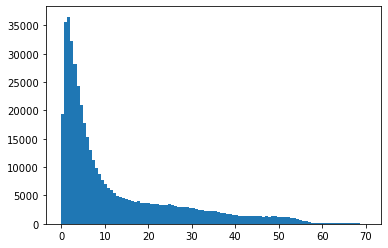

In [143]:
plt.hist(chi_3, bins=100)

In [232]:
idx = np.where(np.logical_and(b_3 < -0.1, k_3 > 0.3))
idx = np.where(k_3 > 1.0)
print(idx)
idx = idx[0][10000]
lyapunov.iloc[idx]


(array([     1,      4,      5, ..., 947059, 948081, 951089]),)


2          0.234114
4          0.138327
8          0.056302
10         0.055188
12         0.035278
             ...   
524288     0.000014
630957     0.000012
794328     0.000011
1000000    0.000010
1048576    0.000010
Name: 70174, Length: 71, dtype: float64

Text(0.5, 1.0, '$a = 1.4, b=1.7e-05, k=1.9$\n$a = 0.00072, k=0.28$')

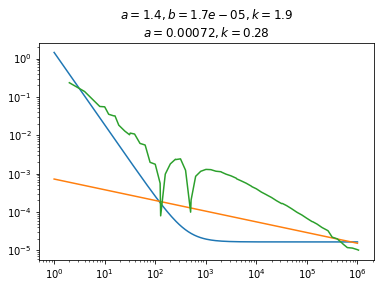

In [233]:
t = np.logspace(0, 6, 200)
r = np.zeros_like(t)
r = (
    a_3[idx] / np.power(t, k_3[idx]) + b_3[idx]
)
plt.plot(t, r)
r = (
    a[idx] / np.power(t, k[idx])
)
plt.plot(t, r)
plt.plot(lyapunov.iloc[idx].index, np.absolute(lyapunov.iloc[idx].to_numpy()))
plt.xscale("log")
plt.yscale("log")
plt.title(
    f"$a = {a_3[idx]:.2}, b={b_3[idx]:.2}, k={k_3[idx]:.2}$\n$a = {a[idx]:.2}, k={k[idx]:.2}$")


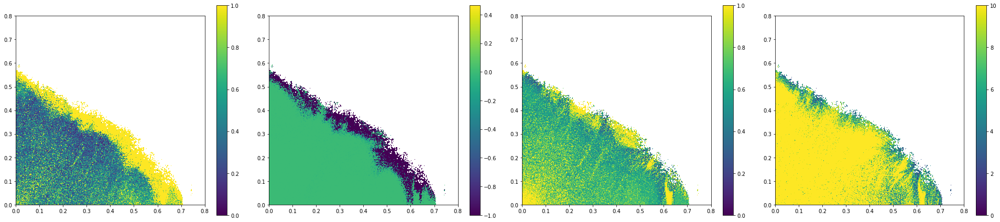

In [214]:
fig, axs = plt.subplots(1, 4, figsize=(27, 6))

tmp_a = a_3.copy()
tmp_b = b_3.copy()
tmp_k = k_3.copy()
tmp_chi = chi_3.copy()

# tmp_a[tmp_b < -1.0] = np.nan
# tmp_chi[tmp_b < -1.0] = np.nan
# tmp_k[tmp_b < -1.0] = np.nan
# tmp_b[tmp_b < -1.0] = np.nan


map = axs[0].imshow(tmp_a.reshape(1000, 1000),
                    origin="lower", extent=extents, vmax=1)
fig.colorbar(map, ax=axs[0])

map = axs[1].imshow(tmp_b.reshape(1000, 1000),
                    origin="lower", extent=extents, vmin=-1.0)
fig.colorbar(map, ax=axs[1])

map = axs[2].imshow(tmp_k.reshape(1000, 1000),
                    origin="lower", extent=extents, vmax=1)
fig.colorbar(map, ax=axs[2])

map = axs[3].imshow(tmp_chi.reshape(1000, 1000),
                    origin="lower", extent=extents, vmax=10)
fig.colorbar(map, ax=axs[3])

plt.tight_layout()


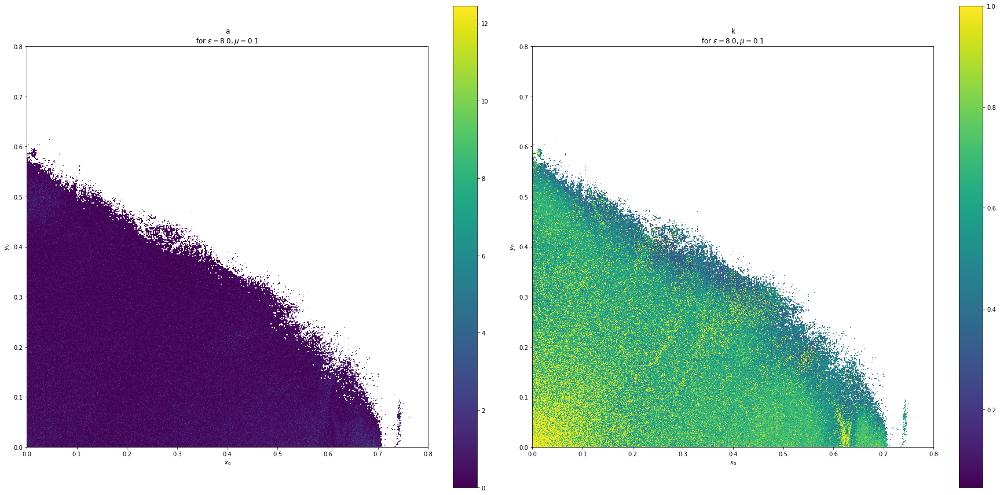

In [71]:
fig, axs = plt.subplots(1, 2, figsize=(25, 12))

tmp_a = a.copy()
tmp_k = k.copy()

tmp_a[stability < 1000] = np.nan
tmp_k[stability < 1000] = np.nan

# tmp_k[tmp_k <= 1] = 0
# tmp_k[tmp_k > 1] = 1

map = axs[0].imshow(tmp_a.reshape(samples, samples), origin="lower", extent=extents)
# set colorbar for map
fig.colorbar(map, ax=axs[0])
axs[0].set_title(f"a\nfor {group_name}")
axs[0].set_xlabel("$x_0$")
axs[0].set_ylabel("$y_0$")

map = axs[1].imshow((tmp_k.reshape(samples, samples)), origin="lower", extent=extents, vmax=1)
# set colorbar for map
fig.colorbar(map, ax=axs[1])
axs[1].set_title(f"k\nfor {group_name}")
axs[1].set_xlabel("$x_0$")
axs[1].set_ylabel("$y_0$")

plt.tight_layout()

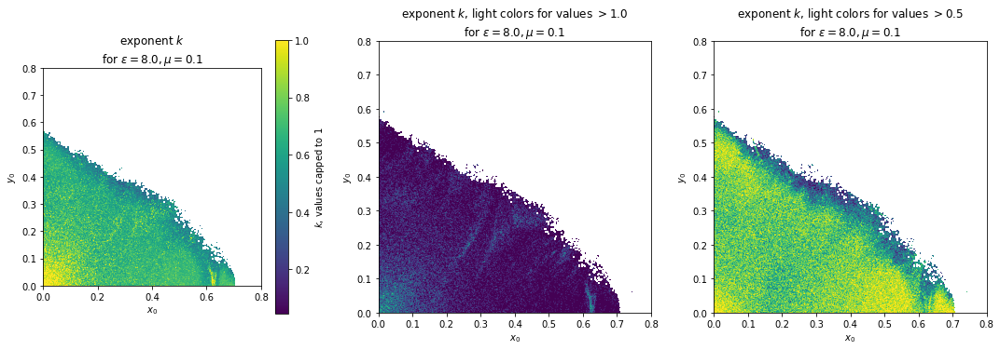

In [100]:
fig, axs = plt.subplots(1,3, figsize=(15, 5))

tmp_k = k.copy()
# tmp_k[tmp_k <= 1] = 0
# tmp_k[tmp_k > 1] = 1

map = axs[0].imshow(
    tmp_k.reshape(samples, samples),
    origin="lower",
    extent=extents,
    vmax=1
)
# set colorbar for map
fig.colorbar(map, ax=axs[0], label="$k$, values capped to 1")
axs[0].set_title(f"exponent $k$\nfor {group_name}")
axs[0].set_xlabel("$x_0$")
axs[0].set_ylabel("$y_0$")

tmp_k = k.copy()
tmp_k[tmp_k <= 1] = 0
tmp_k[tmp_k > 1] = 1

map = axs[1].imshow(
    tmp_k.reshape(samples, samples),
    origin="lower",
    extent=extents,
    vmax=1
)
# set colorbar for map
#fig.colorbar(map, ax=axs[1], label="$k$, values capped to 1")
axs[1].set_title(f"exponent $k$, light colors for values $>1.0$\nfor {group_name}")
axs[1].set_xlabel("$x_0$")
axs[1].set_ylabel("$y_0$")

tmp_k = k.copy()
tmp_k[tmp_k <= 0.5] = 0
tmp_k[tmp_k > 0.5] = 1

map = axs[2].imshow(
    tmp_k.reshape(samples, samples),
    origin="lower",
    extent=extents,
    vmax=1
)
# set colorbar for map
#fig.colorbar(map, ax=axs[2], label="$k$, values capped to 1")
axs[2].set_title(
    f"exponent $k$, light colors for values $>0.5$\nfor {group_name}")
axs[2].set_xlabel("$x_0$")
axs[2].set_ylabel("$y_0$")

plt.tight_layout()
plt.savefig("K_lyapunov.png", dpi=300)

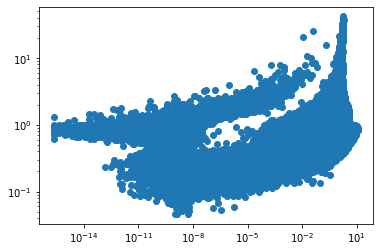

In [58]:
plt.scatter(tmp_a, tmp_k)

plt.xscale("log")
plt.yscale("log")


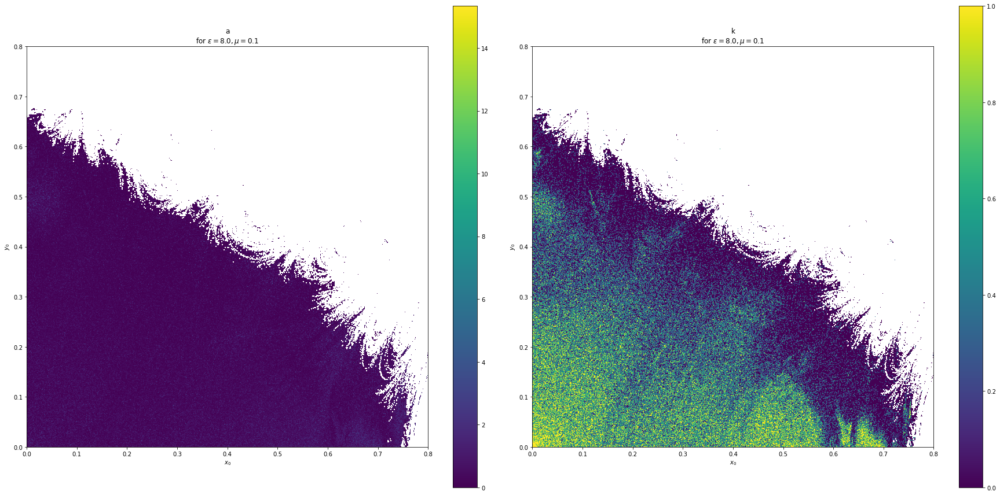

In [68]:
fig, axs = plt.subplots(1, 2, figsize=(25, 12))

tmp_a = a.copy()
tmp_k = k.copy()

tmp_a[stability < 100] = np.nan
tmp_k[stability < 100] = np.nan

tmp_k[tmp_k <= 0.7] = 0
tmp_k[tmp_k > 0.7] = 1

map = axs[0].imshow(tmp_a.reshape(samples, samples),
                    origin="lower", extent=extents)
# set colorbar for map
fig.colorbar(map, ax=axs[0])
axs[0].set_title(f"a\nfor {group_name}")
axs[0].set_xlabel("$x_0$")
axs[0].set_ylabel("$y_0$")

map = axs[1].imshow((tmp_k.reshape(samples, samples)),
                    origin="lower", extent=extents, vmax=1)
# set colorbar for map
fig.colorbar(map, ax=axs[1])
axs[1].set_title(f"k\nfor {group_name}")
axs[1].set_xlabel("$x_0$")
axs[1].set_ylabel("$y_0$")

plt.tight_layout()


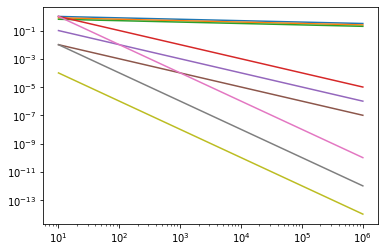

In [63]:
t = np.logspace(1, 6, 200)

# plt.plot(t, 1/t)
# plt.plot(t, 5/t)
plt.plot(t, np.power(10/t, 0.1))
plt.plot(t, np.power(1/t, 0.1))
plt.plot(t, np.power(0.1/t, 0.1))

plt.plot(t, np.power(10/t, 1))
plt.plot(t, np.power(1/t, 1))
plt.plot(t, np.power(0.1/t, 1))

plt.plot(t, np.power(10/t, 2))
plt.plot(t, np.power(1/t, 2))
plt.plot(t, np.power(0.1/t, 2))

plt.yscale("log")
plt.xscale("log")


100%|██████████| 1000000/1000000 [00:25<00:00, 38719.72it/s]


Text(0, 0.5, '$FLI$')

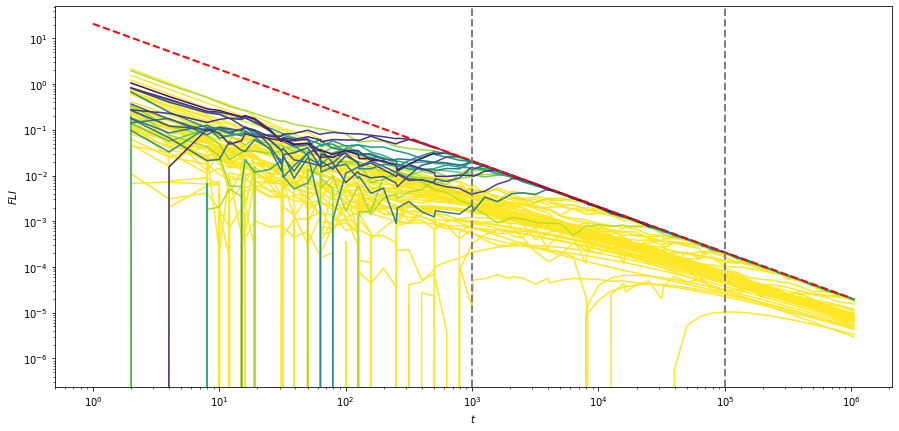

In [42]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

colors = dm.colorize(stability, log10=True, vmin=t1)

for i, (d, c, s) in tqdm(enumerate(zip(lyapunov.iterrows(), colors, stability)), total=len(colors)):
    if i % 10000 == 0:
        if s > t1:
            ax.plot(d[1].index, d[1].to_numpy(), color=c)

t = np.logspace(0, 6, 200)
boundary = np.log(1.0 / config["displacement"]) / t

ax.plot(t, boundary, color="red", linestyle="--", linewidth=2)

ax.set_xscale("log")
ax.set_yscale("log")
#ax.set_ylim(-0.01, 0.01)

ax.axvline(x=t1, color="grey", linestyle="--", linewidth=2)
ax.axvline(x=t2, color="grey", linestyle="--", linewidth=2)


ax.set_xlabel("$t$")
ax.set_ylabel("$FLI$")


In [14]:
print("10000:", np.count_nonzero(np.logical_and(stability >= 10000, stability <= 10100)))
print("100000:", np.count_nonzero(np.logical_and(stability >= 100000, stability <= 101000)))


10000: 388
100000: 187


100%|██████████| 1000000/1000000 [00:27<00:00, 36826.39it/s]


Text(0, 0.5, '$FLI$')

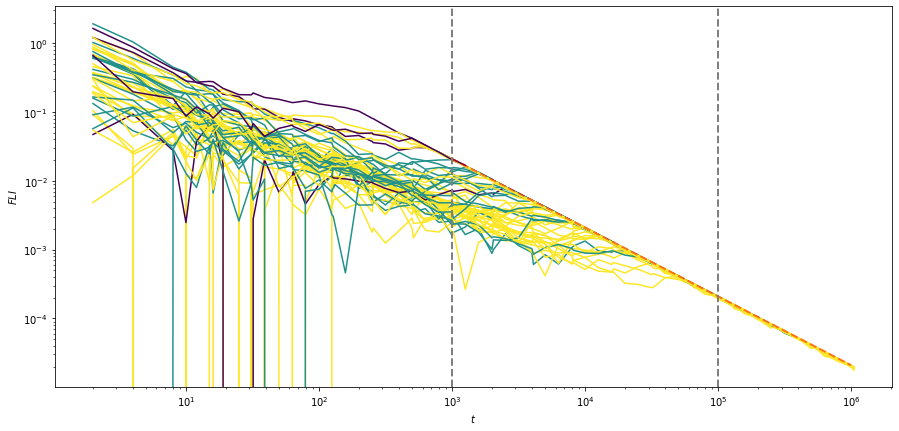

In [43]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

colors = dm.colorize(stability, log10=True, vmin=10000, vmax=1000000)

for i, (d, c, s) in tqdm(enumerate(zip(lyapunov.iterrows(), colors, stability)), total=len(colors)):
    # if s == 1000:
    #     ax.plot(d[1].index, d[1].to_numpy(), color=c)

    if s == 10000:
        ax.plot(d[1].index, d[1].to_numpy(), color=c)
    
    if s >= 100000 and s <= 100100:
        ax.plot(d[1].index, d[1].to_numpy(), color=c)

    if s >= 1000000 and s <= 1001000:
        ax.plot(d[1].index, d[1].to_numpy(), color=c)

    if s >= 10000000 and s <= 10010000:
        ax.plot(d[1].index, d[1].to_numpy(), color=c)

t = np.logspace(3, 6, 200)
boundary = np.log(1.0 / config["displacement"]) / t

ax.plot(t, boundary, color="red", linestyle="--", linewidth=2, alpha=0.5)

ax.set_xscale("log")
ax.set_yscale("log")
#ax.set_ylim(-0.01, 0.01)

ax.axvline(x=t1, color="grey", linestyle="--", linewidth=2)
ax.axvline(x=t2, color="grey", linestyle="--", linewidth=2)

ax.set_xlabel("$t$")
ax.set_ylabel("$FLI$")


If we consider instead just the logarithm of the displacement without the division by number of turns...

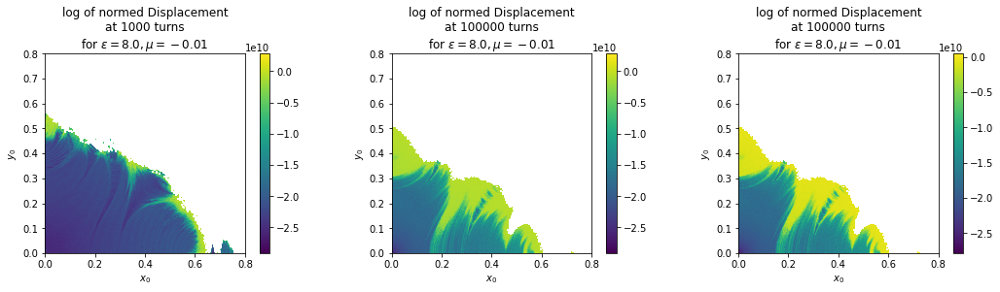

In [62]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4))

im_0 = axs[0].imshow(
    raw_displacement[t1].to_numpy().reshape(
        samples, samples)/config["displacement"],
    origin="lower",
    extent=extents,
)
# set colorbar for im_0
fig.colorbar(im_0, ax=axs[0])
axs[0].set_title(
    f"log of normed Displacement\nat {t1} turns\nfor {group_name}")
axs[0].set_xlabel("$x_0$")
axs[0].set_ylabel("$y_0$")

# use the same colorbar for im_1
im_1 = axs[1].imshow(
    raw_displacement[t2].to_numpy().reshape(samples, samples)/config["displacement"],
    origin="lower",
    extent=extents,
    vmin=im_0.get_clim()[0],
    vmax=im_0.get_clim()[1],
)
# set colorbar for im_1
fig.colorbar(im_1, ax=axs[1])
axs[1].set_title(f"log of normed Displacement\nat {t2} turns\nfor {group_name}")
axs[1].set_xlabel("$x_0$")
axs[1].set_ylabel("$y_0$")


im_1 = axs[2].imshow(
    raw_displacement[t2].to_numpy().reshape(
        samples, samples)/config["displacement"],
    origin="lower",
    extent=extents,
)
# set colorbar for im_1
fig.colorbar(im_1, ax=axs[2])
axs[2].set_title(
    f"log of normed Displacement\nat {t2} turns\nfor {group_name}")
axs[2].set_xlabel("$x_0$")
axs[2].set_ylabel("$y_0$")

plt.tight_layout()


100%|██████████| 1000000/1000000 [00:24<00:00, 40389.33it/s]


Text(0, 0.5, 'Displacement distance $[\\log]$')

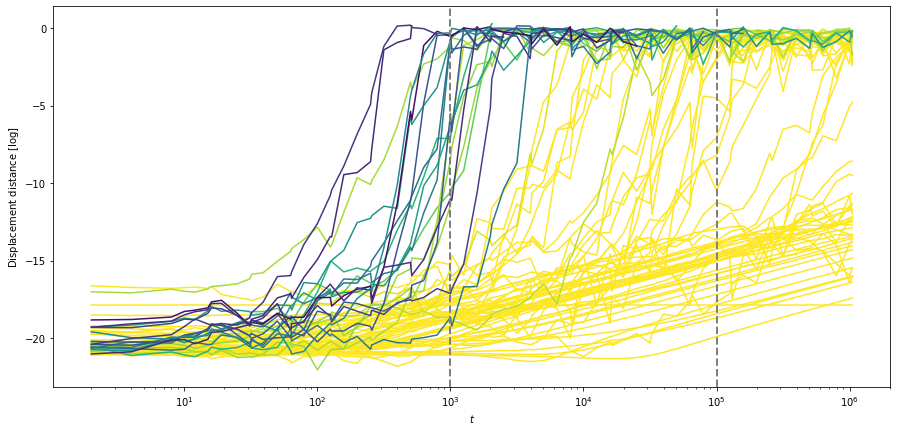

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

colors = dm.colorize(stability, log10=True, vmin=t1)

for i, (d, c, s) in tqdm(enumerate(zip(raw_displacement.iterrows(), colors, stability)), total=len(colors)):
    if i % 10000 == 0:
        if s > t1:
            ax.plot(d[1].index, d[1].to_numpy(), color=c)

t = np.logspace(0, 6, 200)
boundary = np.log(1.0 / config["displacement"]) / t

#ax.plot(t, boundary, color="red", linestyle="--", linewidth=2)

ax.set_xscale("log")
#ax.set_yscale("log")

ax.axvline(x=t1, color="grey", linestyle="--", linewidth=2)
ax.axvline(x=t2, color="grey", linestyle="--", linewidth=2)

ax.set_xlabel("$t$")
ax.set_ylabel("Displacement distance $[\\log]$")

100%|██████████| 1000000/1000000 [00:25<00:00, 39946.39it/s]


Text(0, 0.5, 'Displacement distance $[\\log]$')

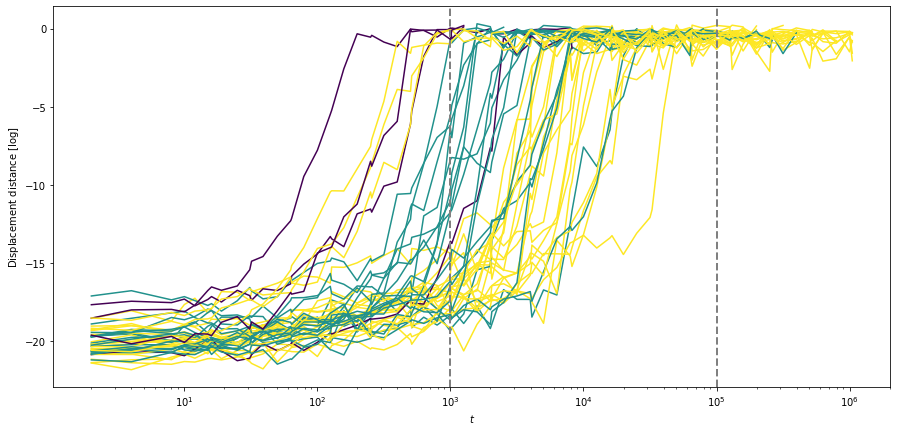

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

colors = dm.colorize(stability, log10=True, vmin=10000, vmax=1000000)

for i, (d, c, s) in tqdm(enumerate(zip(raw_displacement.iterrows(), colors, stability)), total=len(colors)):
    # if s == 1000:
    #     ax.plot(d[1].index, d[1].to_numpy(), color=c)

    if s == 10000:
        ax.plot(d[1].index, d[1].to_numpy(), color=c)
    
    if s >= 100000 and s <= 100100:
        ax.plot(d[1].index, d[1].to_numpy(), color=c)

    if s >= 1000000 and s <= 1001000:
        ax.plot(d[1].index, d[1].to_numpy(), color=c)

t = np.logspace(0, 6, 200)
boundary = np.log(1.0 / config["displacement"]) / t

#ax.plot(t, boundary, color="red", linestyle="--", linewidth=2, alpha=0.5)

ax.set_xscale("log")
#ax.set_yscale("log")

ax.axvline(x=t1, color="grey", linestyle="--", linewidth=2)
ax.axvline(x=t2, color="grey", linestyle="--", linewidth=2)

ax.set_xlabel("$t$")
ax.set_ylabel("Displacement distance $[\\log]$")

## 1.1 - Direct comparisons and correlations with the various Dynamic indicators

### 1.1.0 - Colors!

In [18]:
# Make the base colors
colors_stability = dm.colorize(stability, log10=True)
colors_radius = dm.colorize(data.initial_radius(), vmax=0.7)
colors_rad_stab = dm.colorize(stability, log10=True)

In [19]:
# Mask considering radius
radius_color = 0.3

before_mask = data.initial_radius() <= radius_color
after_mask = data.initial_radius() > radius_color

In [20]:
colors_rad_stab[before_mask] = dm.colorize(
    stability[before_mask], log10=True, cmap="cool")
colors_rad_stab[after_mask] = dm.colorize(
    stability[after_mask], log10=True, cmap="Wistia")

### 1.1.1 - Invariant Lyapunov

Text(0, 0.5, 'Invariant Lyapunov Indicator at 1000')

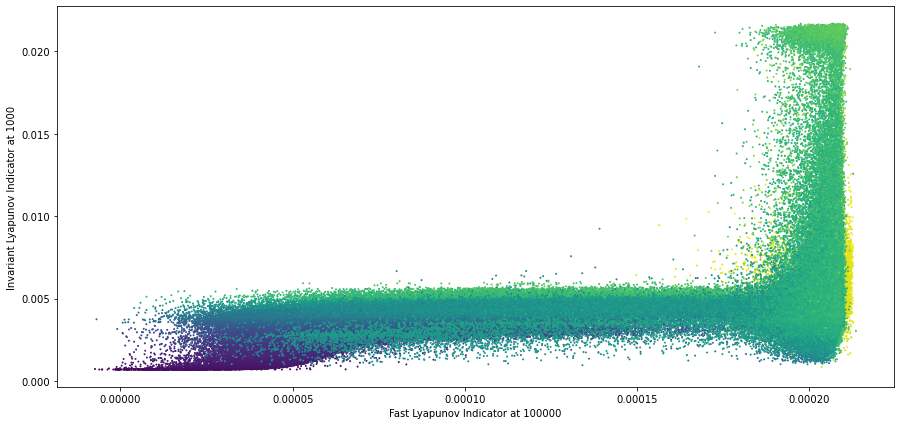

In [21]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

ax.scatter(
    lyapunov[t2].to_numpy(),
    lyapunov_multi[t1].to_numpy(),
    s=1,
    c=colors_radius,
)

ax.set_xlabel(f"Fast Lyapunov Indicator at {t2}")
ax.set_ylabel(f"Invariant Lyapunov Indicator at {t1}")

### 1.1.2 - Reversibility error

/tmp/ipykernel_8039/3124219978.py:5: RuntimeWarning: divide by zero encountered in log10
  np.log10(reverse[t1].to_numpy()),


Text(0, 0.5, 'Reversibility Indicator at 1000')

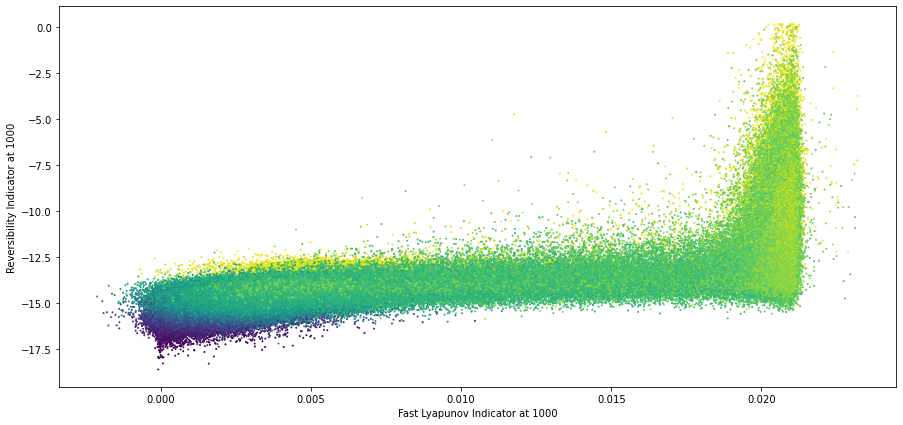

In [36]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

ax.scatter(
    lyapunov[t1].to_numpy(),
    np.log10(reverse[t1].to_numpy()),
    s=1,
    c=colors_radius,
)

ax.set_xlabel(f"Fast Lyapunov Indicator at {t1}")
ax.set_ylabel(f"Reversibility Indicator at {t1}")


### 1.1.3 - SALI and GALI

Text(0, 0.5, 'SALI at 1000')

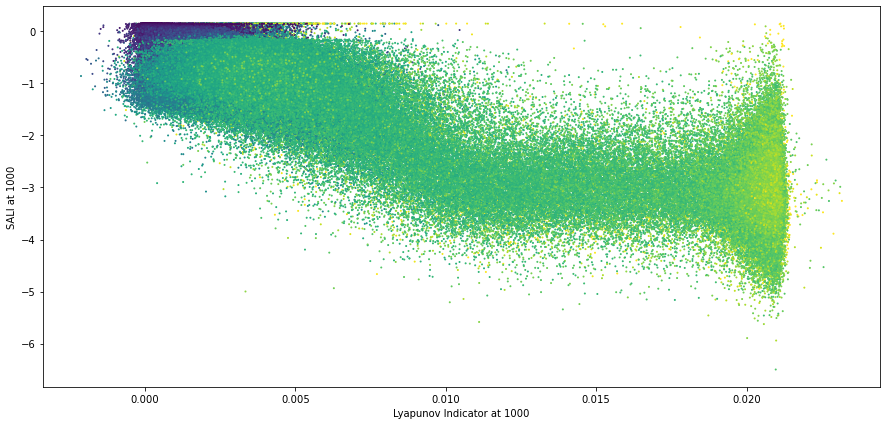

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

ax.scatter(
    lyapunov[t1].to_numpy(),
    np.log10(sali[t1].to_numpy()),
    s=1,
    c=colors_radius,
)

ax.set_xlabel(f"Lyapunov Indicator at {t1}")
ax.set_ylabel(f"SALI at {t1}")


Text(0, 0.5, 'GALI at 1000')

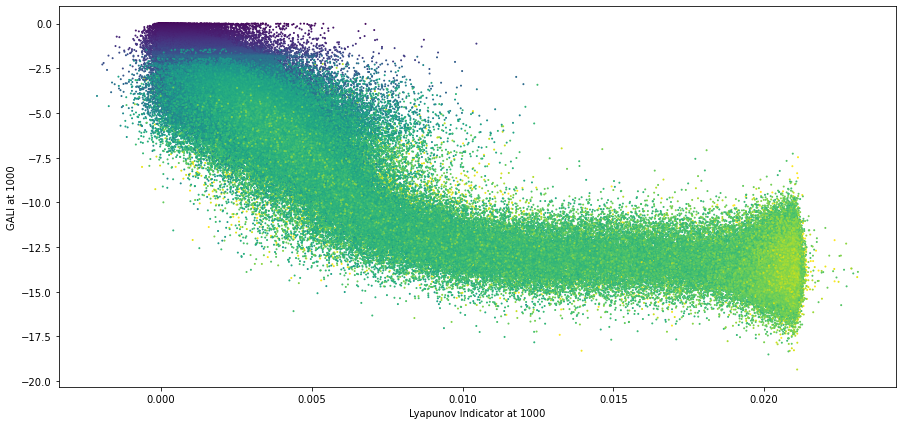

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

ax.scatter(
    lyapunov[t1].to_numpy(),
    np.log10(gali[t1].to_numpy()),
    s=1,
    c=colors_radius,
)

ax.set_xlabel(f"Lyapunov Indicator at {t1}")
ax.set_ylabel(f"GALI at {t1}")

### 1.1.4 - MEGNO

Text(0, 0.5, 'MEGNO at 100000')

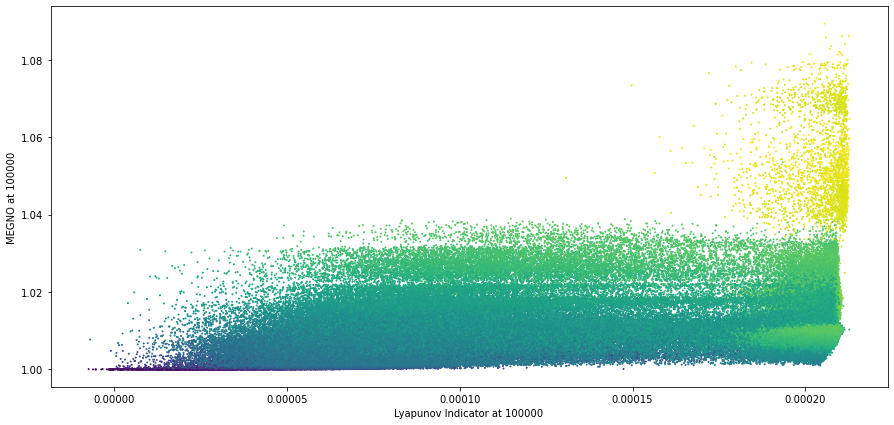

In [30]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

ax.scatter(
    lyapunov[t2].to_numpy(),
    (megno[t2].to_numpy()),
    s=1,
    c=colors_radius,
)

ax.set_xlabel(f"Lyapunov Indicator at {t2}")
ax.set_ylabel(f"MEGNO at {t2}")

## 1.2 - Visualizing convergence for the various Dynamic indicators

Text(0, 0.5, 'Lyapunov Indicator at 100000')

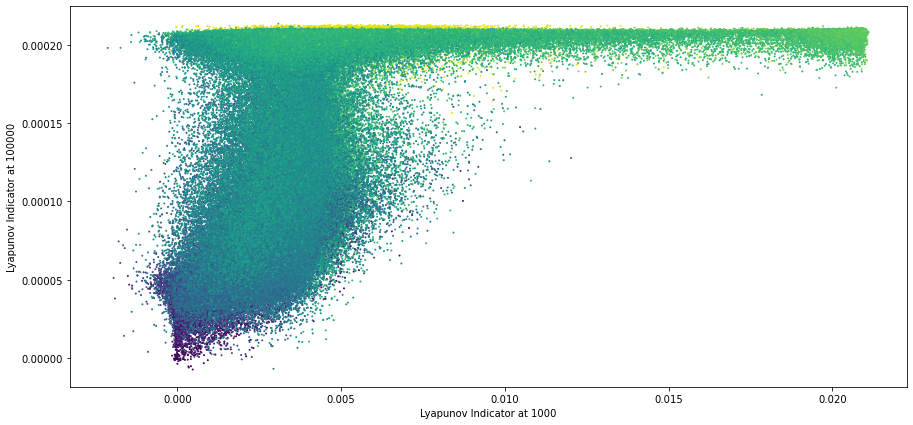

In [25]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

ax.scatter(
    lyapunov[t1].to_numpy(),
    lyapunov[t2].to_numpy(),
    s=1,
    c=colors_radius,
)

ax.set_xlabel(f"Lyapunov Indicator at {t1}")
ax.set_ylabel(f"Lyapunov Indicator at {t2}")

Text(0, 0.5, 'Lyapunov Indicator at 100000')

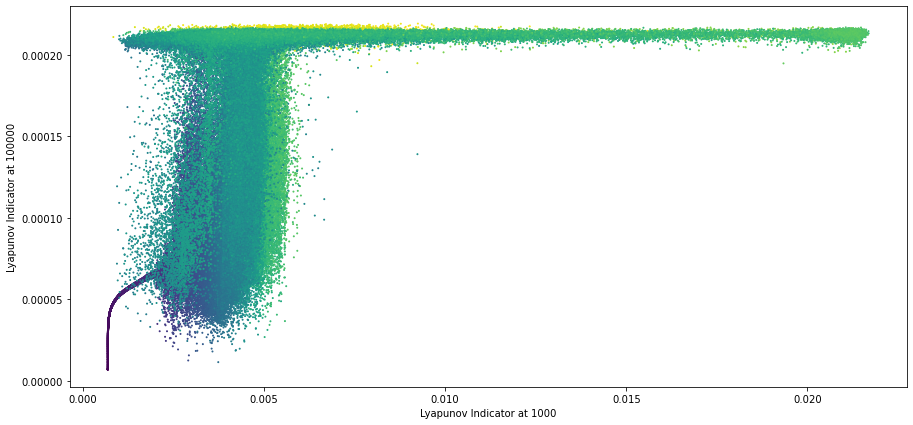

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

ax.scatter(
    lyapunov_multi[t1].to_numpy(),
    lyapunov_multi[t2].to_numpy(),
    s=1,
    c=colors_radius,
)

ax.set_xlabel(f"Lyapunov Indicator at {t1}")
ax.set_ylabel(f"Lyapunov Indicator at {t2}")

/tmp/ipykernel_25866/3792515338.py:4: RuntimeWarning: divide by zero encountered in log10
  np.log10(reverse[t1].to_numpy()),
/tmp/ipykernel_25866/3792515338.py:5: RuntimeWarning: divide by zero encountered in log10
  np.log10(reverse[t2].to_numpy()),


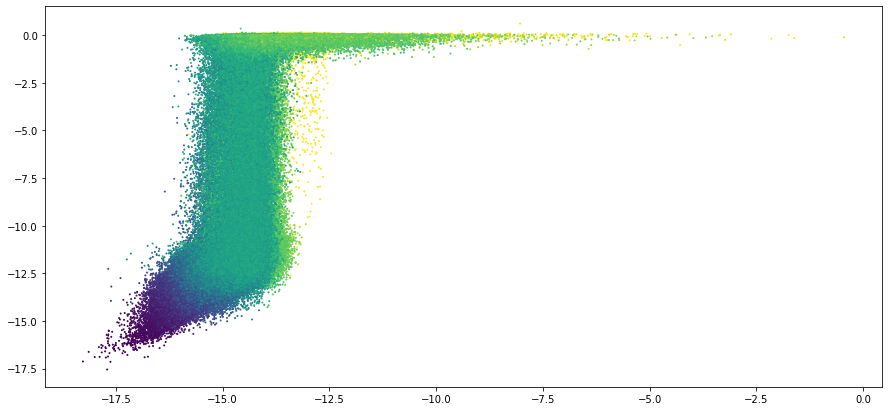

In [128]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

ax.scatter(
    np.log10(reverse[t1].to_numpy()),
    np.log10(reverse[t2].to_numpy()),
    s=1,
    c=colors_radius,
)

ax.set_xlabel(f"Reversibility Indicator at {t1}")
ax.set_ylabel(f"Reversibility Indicator at {t2}")


Text(0, 0.5, 'SALI at 100000')

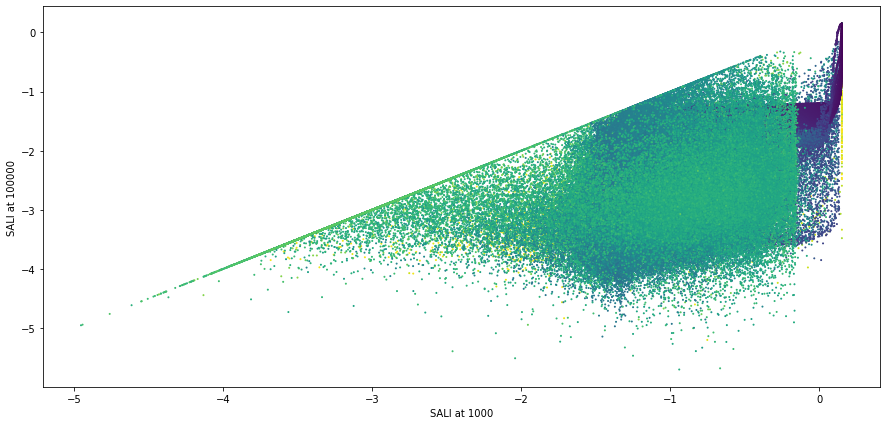

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

ax.scatter(
    np.log10(sali[t1].to_numpy()),
    np.log10(sali[t2].to_numpy()),
    s=1,
    c=colors_radius,
)

ax.set_xlabel(f"SALI at {t1}")
ax.set_ylabel(f"SALI at {t2}")

Text(0, 0.5, 'GALI at 100000')

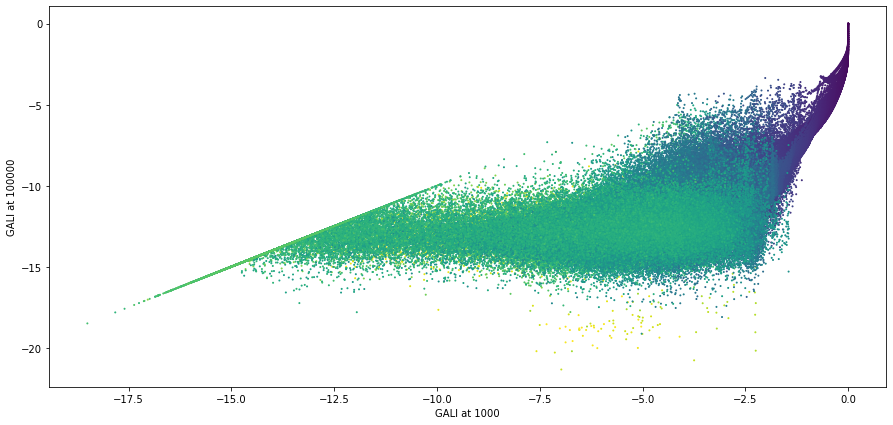

In [28]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

ax.scatter(
    np.log10(gali[t1].to_numpy()),
    np.log10(gali[t2].to_numpy()),
    s=1,
    c=colors_radius,
)

ax.set_xlabel(f"GALI at {t1}")
ax.set_ylabel(f"GALI at {t2}")

## 1.3 - Marking down the line and operating with the classification: how to get the best accuracy?

In [41]:
dm.classify_with_data(lyapunov[t1], np.log10(reverse[t1]), 0.015, -10, stable_if_higher=True)

{'tp': 26325,
 'fp': 81318,
 'fn': 32,
 'tn': 328358,
 'total': 436033,
 'accuracy': 0.8134315521990308,
 'precision': 0.2445584013823472,
 'recall': 0.9987859012785977}

## 1.4 - What happens if we perform an averaging convolution?

In [103]:
lyapunov_convolve = dm.apply_convolution_to_dataset(lyapunov, 4)[0]
lyapunov_multi_convolve = dm.apply_convolution_to_dataset(lyapunov_multi, 4)[0]
reverse_convolve = dm.apply_convolution_to_dataset(reverse, 4)[0]
sali_convolve = dm.apply_convolution_to_dataset(sali, 4)[0]
gali_convolve = dm.apply_convolution_to_dataset(gali, 4)[0]
megno_convolve = dm.apply_convolution_to_dataset(megno, 4)[0]


100%|██████████| 71/71 [00:06<00:00, 10.63it/s]


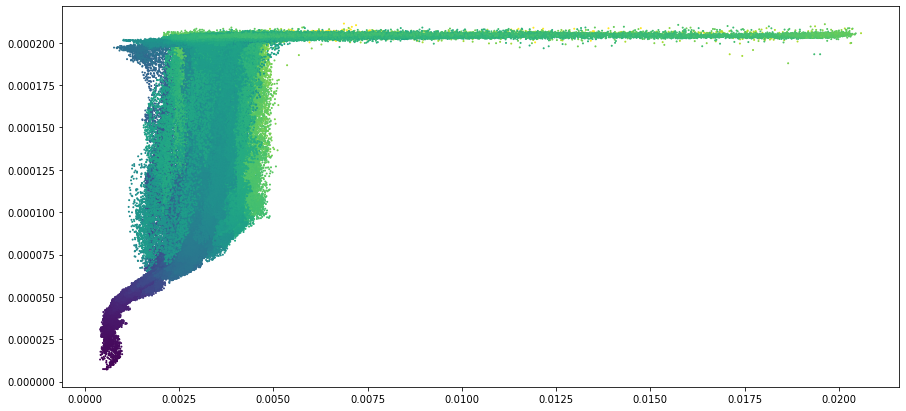

In [133]:
fig, ax = plt.subplots(1, 1, figsize=(15, 7))

ax.scatter(
    lyapunov_convolve[t1].to_numpy(),
    lyapunov_convolve[t2].to_numpy(),
    s=1,
    c=colors_radius,
)
